# The study for HMC BIW PROJECT  

## M/L is used to estimate the value with parameters.  
## 


In [1]:
# import libraries
from __future__ import absolute_import, division, print_function, unicode_literals

# tensorflow libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

# other utiles
import matplotlib.pyplot as plt
from  IPython import display
import numpy as np
import pandas as pd
import seaborn as sns
import pathlib

import sklearn
# import nltk
# from nltk.tokenize import RegexpTokenizer
import os
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
import tensorflow.keras
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
import numpy
from sklearn.model_selection import RandomizedSearchCV, KFold
from sklearn.metrics import make_scorer
# from tensorflow.keras.layers.core import Dense, Dropout, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import Dropout

In [2]:
# check the tensorflow version
print(tf.__version__)

2.1.0


# Pre-Checking Dataframe


In [3]:
dir = r"./"
csv = dir+r"template_trainingdataset_p8.xlsx"
dataset = pd.read_excel(csv)
# dataset = dataset[dataset.Intrusion < 115]
dataset.head()


,Train,p1,p2,p3,p4,p7,p8,p9,p10,Intrusion,...,H320,H340,H360,H380,H400,H420,H440,H460,H480,H500
0,1,193.678511,50.974878,56.657004,127.193789,138.620307,42.077307,108.559538,110.427250,100.450739,...,96.688196,98.207727,99.394159,100.450739,99.855232,98.933873,98.085200,96.642900,95.810974,94.625992
1,2,139.250786,80.555862,64.348697,37.767658,157.430219,165.159790,60.909341,70.166108,102.840710,...,98.688764,100.285372,101.231467,102.840710,102.160757,102.036597,101.369050,99.854062,99.298055,98.200452
2,3,59.060636,169.646628,69.288772,68.998092,101.026681,147.962631,162.208917,36.224921,96.483694,...,93.138371,94.525367,95.435567,96.483694,96.069822,95.628321,94.999723,93.414253,92.742386,91.687990
3,4,176.496336,177.758908,26.135000,182.826127,139.225299,108.033986,61.326045,111.138772,92.903857,...,89.636786,91.015909,92.027323,92.903857,92.669323,92.200102,91.781359,90.318899,90.021352,89.009789
4,5,110.318064,198.036840,63.023811,142.524503,76.898240,90.950332,73.785577,95.766715,104.742175,...,101.731510,103.080110,104.115274,104.742175,104.220981,103.149196,102.457121,100.661030,99.901911,98.601070


In [4]:
# pop of first column: train Maker
dataset.pop("Train")
dataset.head()


,p1,p2,p3,p4,p7,p8,p9,p10,Intrusion,Area,...,H320,H340,H360,H380,H400,H420,H440,H460,H480,H500
0,193.678511,50.974878,56.657004,127.193789,138.620307,42.077307,108.559538,110.427250,100.450739,2.809078,...,96.688196,98.207727,99.394159,100.450739,99.855232,98.933873,98.085200,96.642900,95.810974,94.625992
1,139.250786,80.555862,64.348697,37.767658,157.430219,165.159790,60.909341,70.166108,102.840710,2.810324,...,98.688764,100.285372,101.231467,102.840710,102.160757,102.036597,101.369050,99.854062,99.298055,98.200452
2,59.060636,169.646628,69.288772,68.998092,101.026681,147.962631,162.208917,36.224921,96.483694,2.792549,...,93.138371,94.525367,95.435567,96.483694,96.069822,95.628321,94.999723,93.414253,92.742386,91.687990
3,176.496336,177.758908,26.135000,182.826127,139.225299,108.033986,61.326045,111.138772,92.903857,2.793109,...,89.636786,91.015909,92.027323,92.903857,92.669323,92.200102,91.781359,90.318899,90.021352,89.009789
4,110.318064,198.036840,63.023811,142.524503,76.898240,90.950332,73.785577,95.766715,104.742175,2.803706,...,101.731510,103.080110,104.115274,104.742175,104.220981,103.149196,102.457121,100.661030,99.901911,98.601070


In [5]:
# extract the columns from the dataset
column_names = dataset.columns
print("parameters       : {}".format(column_names[0:8]))
print("output_Intrusion : {}".format(column_names[8]))
print("output_Area      : {}".format(column_names[9]))
print("output_Profile   : {}".format(column_names[10:]))
len(column_names[8:31])


parameters       : Index(['p1', 'p2', 'p3', 'p4', 'p7', 'p8', 'p9', 'p10'], dtype='object')
output_Intrusion : Intrusion
output_Area      : Area
output_Profile   : Index(['H100', 'H120', 'H140', 'H160', 'H180', 'H200', 'H220', 'H240', 'H260',
       'H280', 'H300', 'H320', 'H340', 'H360', 'H380', 'H400', 'H420', 'H440',
       'H460', 'H480', 'H500'],
      dtype='object')


23

In [6]:
# Checking: min/max for each dataset
lst_max = (dataset.max(0))
lst_min = (dataset.min(0))

## Prepare trainging dataset

In [7]:
train_dataset = dataset.sample(frac=0.7)
test__dataset = dataset.drop(train_dataset.index)

In [8]:
train_stats = train_dataset.describe()

In [9]:
for col in column_names[8:]:
    train_stats.pop(col)

train_stats   = train_stats.transpose() 

In [10]:
def norm(x, train_stats):
  stats=train_stats
  return (x - stats['mean']) / stats['std']

In [11]:
train_labels      = pd.DataFrame(None)
test__labels      = pd.DataFrame(None)
train_labels_Intr = pd.DataFrame(None)
test__labels_Intr = pd.DataFrame(None)
train_labels_Area = pd.DataFrame(None)
test__labels_Area = pd.DataFrame(None)
train_labels_Prof = pd.DataFrame(None)
test__labels_Prof = pd.DataFrame(None)

for i in range(8,len(column_names)):
    train_labels[column_names[i]]=train_dataset.pop(column_names[i])
    test__labels[column_names[i]]=test__dataset.pop(column_names[i])

train_labels_Intr = train_labels.loc[:,'Intrusion']
test__labels_Intr = test__labels.loc[:,'Intrusion']
train_labels_Area = train_labels.loc[:,'Area']
test__labels_Area = test__labels.loc[:,'Area']
train_labels_Prof = train_labels.iloc[:,2:]
test__labels_Prof = test__labels.iloc[:,2:]
normed_train_data   = norm( train_dataset,  train_stats )
normed_test__data   = norm( test__dataset,  train_stats )  

# M/L model

## Hyperparameter estimation; Random gridsearch for Neural Network

In [12]:
model = None
def build_model(nn1=8, nn2=8, nn3 = 1, lr=0.01, decay=0., l1=0.01, l2=0.01, activation ='relu', dropout=0):    
    opt = keras.optimizers.Adam(lr=lr, beta_1=0.9, beta_2=0.999,  decay=decay)
    reg = keras.regularizers.l1_l2(l1=l1, l2=l2)

    model = keras.Sequential([
      layers.Dense( nn1, activation=activation, kernel_regularizer=reg, input_shape=[len(train_dataset.keys())] ),
      layers.Dense( nn2, activation=activation, kernel_regularizer=reg),                    
      layers.Dense( nn3, activation=activation )
      ])
    
    model.compile(
      loss='mse',
      optimizer=opt,
      metrics=['mse','accuracy'])

    return model

# Training
def training(EPOCHS=1000, model=model, normed_train_data=None, train_labels=None,verbose=0,monitor='accuracy',patience=5 ):
    model=model
    history = model.fit(
        normed_train_data, train_labels,
        epochs=EPOCHS, validation_split = 0.2, verbose=verbose,
        callbacks=[tfdocs.modeling.EpochDots()]
        )
    print("% : Training : end", model) 
    early_stop = keras.callbacks.EarlyStopping(monitor=monitor, patience=patience) 
    early_history = model.fit(
        normed_train_data, train_labels, 
        epochs=EPOCHS, validation_split = 0.2, verbose=0, 
        callbacks=[early_stop, tfdocs.modeling.EpochDots()]
        )  

    return model, history, early_history       

In [13]:
# neurons in each layer
# nn1=[len(train_dataset.keys())]
nn1     = [8,16,32,64,128,256,512,1024,2048]
nn2     = [8,16,32,64,128,256,512,1024,2048]
nn3     = [23]

# learning algorithm parameters
lr      = [0.0001, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
decay   = [1e-6,1e-9,0]

# dropout and regularisation
l1      = [0, 0.01, 0.003, 0.001,0.0001]
l2      = [0, 0.01, 0.003, 0.001,0.0001]
dropout = [0, 0.1, 0.2, 0.3]

# dictionary summary
grid    = dict(nn1=nn1, nn2=nn2, nn3=nn3, lr=lr, decay=decay, l1=l1, l2=l2, dropout=dropout,)

In [14]:
model = KerasRegressor(build_fn=build_model, epochs=10, batch_size=20, verbose=2)
# model = build_model()

In [15]:
grid = RandomizedSearchCV(estimator=model, cv=KFold(3), param_distributions=grid, verbose=20,  n_iter=10, n_jobs=-1)

In [16]:
rCV = grid.fit(normed_train_data, train_labels)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   1

In [17]:
rCV.best_params_

{'nn3': 23,
 'nn2': 64,
 'nn1': 64,
 'lr': 0.08,
 'l2': 0.003,
 'l1': 0,
 'dropout': 0,
 'decay': 1e-06}

In [18]:
pre = rCV.predict(normed_test__data)

600/600 - 0s


In [19]:
cv_results_df = pd.DataFrame(rCV.cv_results_)
cv_results_df.to_csv(dir+r'\gridsearch.csv')

In [20]:
best_model = rCV.best_estimator_

In [21]:
pre = best_model.predict(normed_test__data)

600/600 - 0s


In [22]:
best_para = best_model.get_params()
nn1       = best_para['nn1'    ]
nn2       = best_para['nn2'    ]
lr        = best_para['lr'     ]
decay     = best_para['decay'  ]
l1        = best_para['l1'     ]
l2        = best_para['l2'     ]
dropout   = best_para['dropout']

In [23]:
model_Tota = build_model(nn1=nn1,nn2=nn2,nn3= 23,lr=lr,decay=decay,l1=l1,l2=l2,activation='relu',dropout=dropout)
model_Intr = build_model(nn1=nn1,nn2=nn2,nn3= 1 ,lr=lr,decay=decay,l1=l1,l2=l2,activation='relu',dropout=dropout)
model_Area = build_model(nn1=nn1,nn2=nn2,nn3= 1 ,lr=lr,decay=decay,l1=l1,l2=l2,activation='relu',dropout=dropout)
model_Prof = build_model(nn1=nn1,nn2=nn2,nn3= 21,lr=lr,decay=decay,l1=l1,l2=l2,activation='relu',dropout=dropout)
# model = best_model


In [24]:
# create the model instance 
EPOCHS = 1000
model  = model_Tota
model, history, early_history                = training(EPOCHS, model, normed_train_data, train_labels     , verbose=0, monitor='mse', patience=5)

EPOCHS = 1000
model  = model_Intr
model_Intr, Intr_history, Intr_early_history = training(EPOCHS, model, normed_train_data, train_labels_Intr, verbose=0, monitor='mse', patience=5)

EPOCHS = 1000
model  = model_Area
model_Area, Area_history, Area_early_history = training(EPOCHS, model, normed_train_data, train_labels_Area, verbose=0, monitor='mse', patience=5)

EPOCHS = 1000
model = model_Prof
model_Prof, Prof_history, Prof_early_history = training(EPOCHS, model, normed_train_data, train_labels_Prof, verbose=0, monitor='mse', patience=5)


Epoch: 0, accuracy:0.0393,  loss:1040.4543,  mse:1039.4176,  val_accuracy:0.5214,  val_loss:230.1856,  val_mse:229.1752,  
....................................................................................................
Epoch: 100, accuracy:0.5848,  loss:76.8872,  mse:75.2849,  val_accuracy:0.7643,  val_loss:85.6473,  val_mse:84.0528,  
....................................................................................................
Epoch: 200, accuracy:0.7973,  loss:74.1962,  mse:71.6504,  val_accuracy:0.7429,  val_loss:89.5027,  val_mse:86.9898,  
....................................................................................................
Epoch: 300, accuracy:0.9152,  loss:73.1183,  mse:70.9824,  val_accuracy:0.9929,  val_loss:86.3580,  val_mse:84.2732,  
....................................................................................................
Epoch: 400, accuracy:0.9750,  loss:71.0348,  mse:69.1052,  val_accuracy:0.9893,  val_loss:86.0367,  val_mse:84.0947

In [25]:
# model.save(dir+r'\trainingdata.h5')
model_Tota.save(dir+r'\trainingdata_Tota.h5')
model_Intr.save(dir+r'\trainingdata_Intr.h5')
model_Area.save(dir+r'\trainingdata_Area.h5')
model_Prof.save(dir+r'\trainingdata_Prof.h5')

In [138]:
# model.save(dir+r'\trainingdata.h5')
model_Tota = keras.models.load_model(dir+r'\trainingdata_Tota.h5')
model_Intr = keras.models.load_model(dir+r'\trainingdata_Intr.h5')
model_Area = keras.models.load_model(dir+r'\trainingdata_Area.h5')
model_Prof = keras.models.load_model(dir+r'\trainingdata_Prof.h5')

In [139]:
train_pred_Tota = model_Tota.predict(normed_train_data)
test__pred_Tota = model_Tota.predict(normed_test__data)

train_pred_Intr = model_Intr.predict(normed_train_data)
test__pred_Intr = model_Intr.predict(normed_test__data)

train_pred_Area = model_Area.predict(normed_train_data)
test__pred_Area = model_Area.predict(normed_test__data)

train_pred_Prof = model_Prof.predict(normed_train_data)
test__pred_Prof = model_Prof.predict(normed_test__data)

In [140]:
train_pred___Max = []
train_labels_Max = []
test__pred___Max = []
test__labels_Max = []
for i in range(0, len(train_pred_Prof)):
    train_pred___Max.append(max(train_pred_Prof[i]))
    train_labels_Max.append(train_labels_Prof.iloc[i].max())
for i in range(0, len(test__pred_Prof)):
    test__pred___Max.append(max(test__pred_Prof[i]))
    test__labels_Max.append(test__labels_Prof.iloc[i].max())

In [141]:
len(test__labels_Max)

600

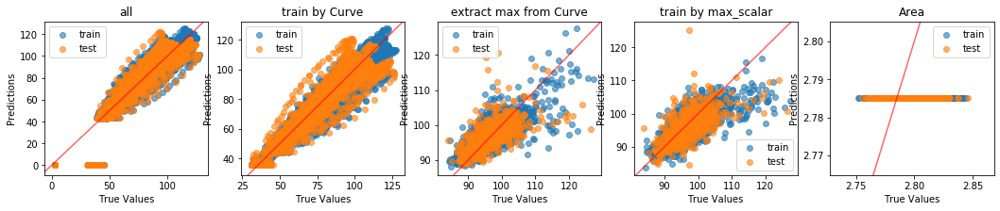

In [142]:
fig, axs = plt.subplots(1, 5,figsize=(18, 3))
# fig.suptitle('pred vs label')
lst_train_labels = [train_labels   ,train_labels_Prof,train_labels_Max,train_labels_Intr,train_labels_Area]
lst_test__labels = [test__labels   ,test__labels_Prof,test__labels_Max,test__labels_Intr,test__labels_Area]
lst_train_pred   = [train_pred_Tota,train_pred_Prof  ,train_pred___Max,train_pred_Intr  ,train_pred_Area  ]
lst_test__pred   = [test__pred_Tota,test__pred_Prof  ,test__pred___Max,test__pred_Intr  ,test__pred_Area  ]
lst_title        = ['all' ,'train by Curve'    ,'extract max from Curve','train by max_scalar', 'Area' ]

for i in range(0,len(lst_train_labels)):
    axs[i].scatter(lst_train_labels[i] ,lst_train_pred[i] ,s=None,c='tab:blue'   ,label='train',alpha=0.6)
    axs[i].scatter(lst_test__labels[i] ,lst_test__pred[i] ,s=None,c='tab:orange' ,label='test' ,alpha=0.6)
    # axs[i].set_xlim([0,130])
    # axs[i].set_ylim([0,130])
    axs[i].set_xlim([axs[i].set_xlim()[0],axs[i].set_xlim()[1]])
    axs[i].set_ylim([axs[i].set_ylim()[0],axs[i].set_ylim()[1]])
    _ = axs[i].plot([-1000, 1000], [-1000, 1000],'red',alpha=0.6 )
    axs[i].set_title(lst_title[i])
    axs[i].legend()
    axs[i].set_xlabel('True Values')
    axs[i].set_ylabel('Predictions')

#  plt.grid(True)
# plt.axis('equal')
# plt.axis('square')

# The study for Other M/L models

In [143]:
# lst_train_labels = [train_labels   ,train_labels_Prof,train_labels_Max,train_labels_Intr,train_labels_Area]
# lst_test__labels = [test__labels   ,test__labels_Prof,test__labels_Max,test__labels_Intr,test__labels_Area]
# lst_train_pred   = [train_pred_Tota,train_pred_Prof  ,train_pred___Max,train_pred_Intr  ,train_pred_Area  ]
# lst_test__pred   = [test__pred_Tota,test__pred_Prof  ,test__pred___Max,test__pred_Intr  ,test__pred_Area  ]
# lst_title        = ['all' ,'train by Curve'    ,'extract max from Curve','train by max_scalar', 'Area' ]

X_data = normed_train_data.values
Y_data = train_labels_Max

In [144]:
X_data = normed_train_data.values
Y_data = train_labels_Max
# SVR
from sklearn.svm import SVR
svr = SVR(kernel='rbf', degree=1, gamma='scale', coef0=0., tol=0.001, C=1, epsilon=0.1, shrinking=True, cache_size=200, verbose=False, max_iter=-1)
y_rbf_t = svr.fit(X_data, Y_data).predict(X_data)

# RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(n_estimators=200, random_state=2, bootstrap=True, 
    criterion='mse', max_depth=None, max_leaf_nodes=None,
    min_samples_split=2, min_samples_leaf=1, 
    max_features='auto')
# y_reg_t  = regr.fit(X_data, Y_data).predict(X_data)

# AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
adab = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4),learning_rate=1.0,loss='linear', n_estimators=50, random_state=None)
#      AdaBoostRegressor(base_estimator=None, *, n_estimators=50, learning_rate=1.0, loss='linear', random_state=None)

y_ada_t = adab.fit(X_data, Y_data).predict(X_data)

## RandomizedSearchCV

In [145]:
from sklearn.model_selection import RandomizedSearchCV
from pprint import pprint
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)               
# from pprint import pprint
# print('Parameters currently in use:\n')
# pprint(regr.get_params())
#
# {'bootstrap': True,
#  'ccp_alpha': 0.0,
#  'criterion': 'mse',
#  'max_depth': None,
#  'max_features': 'auto',
#  'max_leaf_nodes': None,
#  'max_samples': None,
#  'min_impurity_decrease': 0.0,
#  'min_impurity_split': None,
#  'min_samples_leaf': 1,
#  'min_samples_split': 2,
#  'min_weight_fraction_leaf': 0.0,
#  'n_estimators': 200,
#  'n_jobs': None,
#  'oob_score': False,
#  'random_state': 2,
#  'verbose': 0,
#  'warm_start': False}

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [146]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
# estimator = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = regr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_data, Y_data)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  3.2min finished


RandomizedSearchCV(cv=3,
                   estimator=RandomForestRegressor(n_estimators=200,
                                                   random_state=2),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [147]:
rf_random.best_params_

{'n_estimators': 200,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 80,
 'bootstrap': True}

In [148]:
regr = RandomForestRegressor(n_estimators=600,min_samples_split=2,min_samples_leaf=4,max_features='auto',max_depth=40,bootstrap=True)
y_reg_t  = regr.fit(X_data, Y_data).predict(X_data)

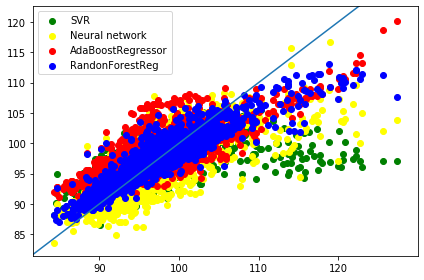

In [149]:
plt.scatter(Y_data, y_rbf_t         , color='green', label='SVR'  )
plt.scatter(Y_data, train_pred_Intr , color='yellow',label='Neural network')
plt.scatter(Y_data, y_ada_t         , color='red',   label='AdaBoostRegressor')
plt.scatter(Y_data, y_reg_t         , color='blue',  label='RandonForestReg'  )
plt.legend()
plt.tight_layout()
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([0, 150], [0, 150])
plt.show()
# print("time : ", time.time() - start_time)

In [150]:
X_data   = normed_test__data.values
Y_data_p = test__labels_Intr.values
# X_data
y_rbf_p  = svr.predict(X_data)
y_reg_p  = regr.predict(X_data)
y_ada_p  = adab.predict(X_data)
# y_nn   = model_Intr.predict(X_data).flatten()

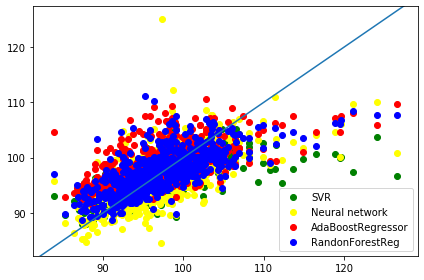

In [151]:
plt.scatter(Y_data_p, y_rbf_p         , color='green', label='SVR'  )
plt.scatter(Y_data_p, test__pred_Intr , color='yellow',label='Neural network')
plt.scatter(Y_data_p, y_ada_p         , color='red',   label='AdaBoostRegressor')
plt.scatter(Y_data_p, y_reg_p         , color='blue',  label='RandonForestReg'  )
plt.legend()
plt.tight_layout()
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([0, 150], [0, 150])
plt.show()

In [152]:
# lst_train_labels = [train_labels,train_labels_InMx,train_labels_Max,train_labels_Intr,train_labels_Area]
train_labels.to_csv(dir+r"\train_labels.csv")
train_labels_Prof.to_csv(dir+r"\train_labels_Prof.csv")
train_labels_Max_arr=np.array(train_labels_Max)
train_labels_Max=pd.DataFrame(train_labels_Max_arr)
train_labels_Max.to_csv( dir+r"\train_labels_Max.csv")
train_labels_Intr.to_csv(dir+r"\train_labels_Intr.csv")
train_labels_Area.to_csv(dir+r"\train_labels_Area.csv")
# # lst_test__labels = [test__labels,test__labels_InMx,test__labels_Max,test__labels_Intr,test__labels_Area]
test__labels.to_csv(dir+r"\test__labels.csv")
test__labels_Prof.to_csv(dir+r"\test__labels_Prof.csv")
test__labels_Max_arr=np.array(test__labels_Max)
test__labels_Max=pd.DataFrame(test__labels_Max_arr)
test__labels_Max.to_csv( dir+r"\test__labels_Max.csv")
test__labels_Intr.to_csv(dir+r"\test__labels_Intr.csv")
test__labels_Area.to_csv(dir+r"\test__labels_Area.csv")
# lst_train_pred   = [train_pred  ,train_pred_InMx  ,train_pred_Max  ,train_pred_Intr  ,train_pred_Area  ]
np.savetxt(dir+r"\train_pred.csv"     ,train_pred     ,delimiter="," )
np.savetxt(dir+r"\train_pred_Prof.csv",train_pred_Prof,delimiter="," )
np.savetxt(dir+r"\train_pred_Max.csv" ,train_pred_Max ,delimiter="," )
np.savetxt(dir+r"\train_pred_Intr.csv",train_pred_Intr,delimiter="," )
np.savetxt(dir+r"\train_pred_Area.csv",train_pred_Area,delimiter="," )
# lst_test__pred   = [test__pred  ,test__pred_InMx  ,test__pred_Max  ,test__pred_Intr  ,test__pred_Area  ]
np.savetxt(dir+r"\test__pred.csv"     ,test__pred     ,delimiter="," )
np.savetxt(dir+r"\test__pred_Prof.csv",test__pred_Prof,delimiter="," )
np.savetxt(dir+r"\test__pred_Max.csv" ,test__pred_Max ,delimiter="," )
np.savetxt(dir+r"\test__pred_Intr.csv",test__pred_Intr,delimiter="," )
np.savetxt(dir+r"\test__pred_Area.csv",test__pred_Area,delimiter="," )
# Other prediction
pd.DataFrame(y_rbf_t).to_csv(dir+r"\y_rbf_t.csv")
pd.DataFrame(y_rbf_p).to_csv(dir+r"\y_rbf_p.csv")
pd.DataFrame(y_ada_t).to_csv(dir+r"\y_ada_t.csv")
pd.DataFrame(y_ada_p).to_csv(dir+r"\y_ada_p.csv")
pd.DataFrame(y_reg_t).to_csv(dir+r"\y_reg_t.csv")
pd.DataFrame(y_reg_p).to_csv(dir+r"\y_reg_p.csv")


NameError: name 'train_pred_Max' is not defined

In [153]:
# test_mae_score, test_mae_score1 = model_Tota.evaluate( normed_test__data, test__labels_Intr )
# test_mae_score, test_mae_score1 = model_Tota.evaluate( normed_test__data, test__labels_Intr )
# test_mae_score, test_mae_score1 = model_Tota.evaluate( normed_test__data, test__labels_Intr )
# test_mae_score, test_mae_score1 = model_Tota.evaluate( normed_test__data, test__labels_Intr )

No handles with labels found to put in legend.


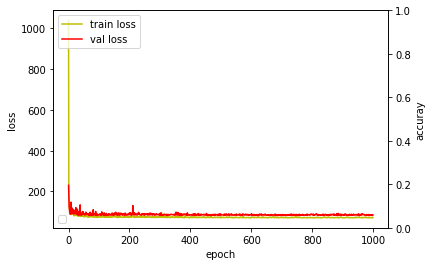

In [154]:
# # 모델 학습 과정 표시하기
# %matplotlib inline
import matplotlib.pyplot as plt
hist = history

fig, loss_ax = plt.subplots()
acc_ax = loss_ax.twinx()

loss_ax.plot(hist.history['loss'], 'y', label='train loss')
loss_ax.plot(hist.history['val_loss'], 'r', label='val loss')

# acc_ax.plot(hist.history['accuracy'], 'b', label='train acc')
# acc_ax.plot(hist.history['val_accuracy'], 'g', label='val acc')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
acc_ax.set_ylabel('accuray')

loss_ax.legend(loc='upper left')
acc_ax.legend(loc='lower left')

plt.show()

In [155]:
train_pred      = model.predict(normed_train_data)
train_pred_Prof = model.predict(normed_train_data)
train_pred_Intr = model.predict(normed_train_data)
train_pred_Area = model.predict(normed_train_data)
test__pred      = model.predict(normed_test__data)
test__pred_Prof = model.predict(normed_test__data)
test__pred_Intr = model.predict(normed_test__data)
test__pred_Area = model.predict(normed_test__data)

In [156]:
fig, axs = plt.subplots(1, 5,figsize=(18, 3))
# fig.suptitle('pred vs label')
lst_train_labels = [train_labels,train_labels_Prof,train_labels_Intr,train_labels_Area]
lst_test__labels = [test__labels,test__labels_Prof,test__labels_Intr,test__labels_Area]
lst_train_pred   = [train_pred  ,train_pred_Prof  ,train_pred_Intr  ,train_pred_Area  ]
lst_test__pred   = [test__pred  ,test__pred_Prof  ,test__pred_Intr  ,test__pred_Area  ]
lst_title        = ['all' ,'train by Curve'    ,'extract max from Curve','train by max_scalar', 'Area' ]

for i in range(0,len(lst_train_labels)):
    axs[i].scatter(lst_train_labels[i]     ,lst_train_pred[i]     ,s=None,c='tab:blue'   ,label='train',alpha=0.6)
    axs[i].scatter(lst_test__labels[i]     ,lst_test__pred[i]     ,s=None,c='tab:orange' ,label='test' ,alpha=0.6)
    axs[i].set_xlim([axs[i].set_xlim()[0],axs[i].set_xlim()[1]])
    axs[i].set_ylim([axs[i].set_ylim()[0],axs[i].set_ylim()[1]])
    _ = axs[i].plot([-1000, 1000], [-1000, 1000],'red',alpha=0.6 )
    axs[i].set_title(lst_title[i])
    axs[i].legend()
    axs[i].set_xlabel('True Values')
    axs[i].set_ylabel('Predictions')

#  plt.grid(True)
# plt.axis('equal')
# plt.axis('square')

ValueError: x and y must be the same size

In [157]:
train_predictions = model.predict(normed_train_data).flatten()
test__predictions = model.predict(normed_test__data).flatten()
print("{},{}".format(len(train_predictions),len(train_labels_Intr)))
plt.scatter(train_labels, train_predictions)
plt.scatter(test__labels, test__predictions)

plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.axis('equal')
plt.axis('square')
plt.xlim([plt.xlim()[0],plt.xlim()[1]])
plt.ylim([plt.ylim()[0],plt.ylim()[1]])
_ = plt.plot([0, 150], [0, 150])

29400,1400


ValueError: x and y must be the same size

In [158]:
error = test__predictions - test__labels

plt.hist(error, bins = 25)
plt.xlabel("Prediction Error")
_ = plt.ylabel("Count")

ValueError: Unable to coerce to Series, length must be 23: given 12600

## Optimization

In [159]:
import pandas as pd
import numpy as np
import os
from tensorflow.keras.models import Sequential, load_model
from scipy import optimize
import time

In [160]:
# predict_func
# Mean square error between test and prediction

def predict_nn( lst ):
    import math
    # # Result of prediction data 
    reg = 0 
    
    lstVar  = [ var  for var  in lst    ]

    lstVarN = [ norm(varN, train_stats) for varN in lstVar ]

    # predict_Reg  = model_Reg.predict( [lstVarN] )[0]
    predict = model.predict( [lstVarN] )[0]

    normPred=[]
    for i in range(0,len(predict)):
        normPred.append(math.sqrt(((predict[i]-lst_min[i+8])/(lst_max[i+8]-lst_min[i+8]))**2 ))

    Intrusion = normPred[0]
    Area      = normPred[1]
    IntruMax  = max(normPred[2:])

    # print("min: {}, max: {}".format(lst_min[30], lst_max[30]))
    print("parameter: {}".format(lstVar))
    print("Intursion: {}, Area: {},{}".format(max(predict[2:]), predict[1],IntruMax))

    return  IntruMax + Area


In [161]:
# model = None

# la                 = [8, 8, 1]
# activation         = ['elu', 'relu', 'exponential', 'linear', 'selu', 'sigmoid', 'softmax', 'softplus', 'softsign']
# kernel_regularizer = keras.regularizers.l2(0.01)
# input_shape        = [len(train_dataset.keys())]
# optimizer          = tf.keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
# # optimizer = tf.keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0)
# #optimizer = tf.keras.optimizers.Adagrad(lr=0.01, epsilon=None, decay=0.0)
# #optimizer = tf.keras.optimizers.SGD(lr=0.01, momentum=0.0, decay=0.0, nesterov=False)
# #optimizer = tf.keras.optimizers.Adadelta(lr=1.0, rho=0.95, epsilon=None, decay=0.0)
# #optimizer = tf.keras.optimizers.Adamax(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
# #optimizer = tf.keras.optimizers.Nadam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=None, schedule_decay=0.004)

# loss               = 'mae'
# metrics            =['mse','mae','mape','accuracy']

# def build_model(la, activation, kernel_regularizer, input_shape):
#     model = keras.Sequential([
#       layers.Dense(la[0], activation, kernel_regularizer, input_shape),
#       layers.Dense(la[1], activation, kernel_regularizer, input_shape),  
#       layers.Dense(la[2], activation)
#       ])    
#     model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
#     return model

In [162]:
# def create_model( nl1=1, nl2=1,  nl3=1, 
#                  nn1=1000, nn2=500, nn3 = 200, lr=0.01, decay=0., l1=0.01, l2=0.01,
#                 act = 'relu', dropout=0, input_shape=8, output_shape=1):
#     '''This is a model generating function so that we can search over neural net 
#     parameters and architecture'''
    
#     opt = keras.optimizers.Adam(lr=lr, beta_1=0.9, beta_2=0.999,  decay=decay)
#     reg = keras.regularizers.l1_l2(l1=l1, l2=l2)
                                                     
#     model = keras.Sequential()
    
#     # for the firt layer we need to specify the input dimensions
#     first=True
    
#     for i in range(nl1):
#         if first:
#             model.add(Dense(nn1, input_dim=input_shape, activation=act, kernel_regularizer=reg))
#             first=False
#         else: 
#             model.add(Dense(nn1, activation=act, kernel_regularizer=reg))
#         if dropout!=0:
#             model.add(Dropout(dropout))
            
#     for i in range(nl2):
#         if first:
#             model.add(Dense(nn2, input_dim=input_shape, activation=act, kernel_regularizer=reg))
#             first=False
#         else: 
#             model.add(Dense(nn2, activation=act, kernel_regularizer=reg))
#         if dropout!=0:
#             model.add(Dropout(dropout))
            
#     for i in range(nl3):
#         if first:
#             model.add(Dense(nn3, input_dim=input_shape, activation=act, kernel_regularizer=reg))
#             first=False
#         else: 
#             model.add(Dense(nn3, activation=act, kernel_regularizer=reg))
#         if dropout!=0:
#             model.add(Dropout(dropout))
            
#     model.add(Dense(output_shape, activation=act))
#     model.compile(loss='mse', optimizer=opt, metrics=['mse'],)
#     return model

In [163]:
# def create_model( nl1=1, nl2=1,  nl3=1, 
#                  nn1=1000, nn2=500, nn3 = 200, lr=0.01, decay=0., l1=0.01, l2=0.01,
#                 act = 'relu', dropout=0, input_shape=1000, output_shape=20):
#     '''This is a model generating function so that we can search over neural net 
#     parameters and architecture'''
    
#     opt = keras.optimizers.Adam(lr=lr, beta_1=0.9, beta_2=0.999,  decay=decay)
#     reg = keras.regularizers.l1_l2(l1=l1, l2=l2)
                                                     
#     model = Sequential()
    
#     # for the firt layer we need to specify the input dimensions
#     first=True
    
#     for i in range(nl1):
#         if first:
#             model.add(Dense(nn1, input_dim=input_shape, activation=act, kernel_regularizer=reg))
#             first=False
#         else: 
#             model.add(Dense(nn1, activation=act, kernel_regularizer=reg))
#         if dropout!=0:
#             model.add(Dropout(dropout))
            
#     for i in range(nl2):
#         if first:
#             model.add(Dense(nn2, input_dim=input_shape, activation=act, kernel_regularizer=reg))
#             first=False
#         else: 
#             model.add(Dense(nn2, activation=act, kernel_regularizer=reg))
#         if dropout!=0:
#             model.add(Dropout(dropout))
            
#     for i in range(nl3):
#         if first:
#             model.add(Dense(nn3, input_dim=input_shape, activation=act, kernel_regularizer=reg))
#             first=False
#         else: 
#             model.add(Dense(nn3, activation=act, kernel_regularizer=reg))
#         if dropout!=0:
#             model.add(Dropout(dropout))
            
#     model.add(Dense(output_shape, activation='sigmoid'))
#     model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'],)
#     return model

In [164]:
# from sklearn.model_selection import RandomizedSearchCV
# random_grid = {'n_estimators': n_estimators,
#                'max_features': max_features,
#                'max_depth': max_depth,
#                'min_samples_split': min_samples_split,
#                'min_samples_leaf': min_samples_leaf,
#                'bootstrap': bootstrap}

In [165]:
# estimator = regr
# param_distributions = random_grid
# n_iter = 100
# cv = 3
# verbose = 2
# random_state=42
# n_jobs=-1

In [166]:
# rcv = RandomizedSearchCV(estimator, param_distributions, *, n_iter=10, scoring=None, n_jobs=None, iid='deprecated', refit=True, cv=None, verbose=2, pre_dispatch='2*n_jobs', random_state=None, error_score=nan, return_train_score=False)
# # Fit the random search model
# search = rcv.fit(X_data, Y_data)

In [167]:
# search.best_params_

## M/L for all

In [168]:
# # create the model instance 
# EPOCHS = 1000
# nPar = 8
# nOut = 23
# iunit = (nPar * nOut)*2
# ounit = nOut
# print("nPar: {}, nOut: {}, iunit: {}, ounit: {}".format(nPar,nOut,iunit,ounit))

# model = build_model(iunit, ounit, train_dataset,activation=None,loss='mape',metrics=['mape'])
# model, history, early_history = training(EPOCHS, model, normed_train_data, train_labels, verbose=0, monitor='mape', patience=5)
# model.save(dir+r'\trainingdata.h5')

# EPOCHS = 1000
# nPar = 8
# nOut = 1
# iunit = (nPar * nOut)*4
# ounit = nOut

# model_Intr = build_model(iunit, ounit, train_dataset,activation=None,loss='mape',metrics=['mape'])
# model_Intr, Intr_history, Intr_early_history = training(EPOCHS, model_Intr, normed_train_data, train_labels_Intr, verbose=0, monitor='mape', patience=5)
# model_Intr.save(dir+r'\trainingdata_Intr.h5')

# model_Area = build_model(iunit, ounit, train_dataset,activation=None,loss='mape',metrics=['mape'])
# model_Area, Area_history, Area_early_history = training(EPOCHS, model_Area, normed_train_data, train_labels_Area, verbose=0, monitor='mape', patience=5)
# model_Area.save(dir+r'\trainingdata_Area.h5')

# EPOCHS = 1000
# nPar = 8
# nOut = 21
# iunit = (nPar * nOut)*2
# ounit = nOut

# model_InMx = build_model(iunit, ounit, train_dataset,activation=None,loss='mape',metrics=['mape'])
# model_InMx, InMx_history, InMx_early_history = training(EPOCHS, model_InMx, normed_train_data, train_labels_InMx, verbose=0, monitor='mape', patience=5)
# model_InMx.save(dir+r'\trainingdata_InMx.h5')


In [169]:
# from pprint import pprint
# print('Parameters currently in use:\n')
# pprint(model.get_params())


In [170]:
# score     , score1      = model.evaluate(      normed_test__data, test__labels      )
# score_Intr, score1_Intr = model_Intr.evaluate( normed_test__data, test__labels_Intr )
# score_Area, score1_Area = model_Area.evaluate( normed_test__data, test__labels_Area )
# score_InMx, score1_InMx = model_InMx.evaluate( normed_test__data, test__labels_InMx )
# print("score     : {}, score1     : {} ".format(score, score1))
# print("score_Intr: {}, score1_Intr: {} ".format(score_Intr, score1_Intr))
# print("score_Area: {}, score1_Area: {} ".format(score_Area, score1_Area))
# print("score_InMx: {}, score1_InMx: {} ".format(score_InMx, score1_InMx))


In [171]:
# model      = keras.models.load_model(dir+r'\trainingdata.h5')
# model_Intr = keras.models.load_model(dir+r'\trainingdata_Intr.h5')
# model_Area = keras.models.load_model(dir+r'\trainingdata_Area.h5')
# model_InMx = keras.models.load_model(dir+r'\trainingdata_InMx.h5')

In [172]:
# train_pred      = model.predict(normed_train_data)
# test__pred      = model.predict(normed_test__data)

# train_pred_Intr = model_Intr.predict(normed_train_data)
# test__pred_Intr = model_Intr.predict(normed_test__data)

# train_pred_Area = model_Area.predict(normed_train_data)
# test__pred_Area = model_Area.predict(normed_test__data)

# train_pred_InMx = model_InMx.predict(normed_train_data)
# test__pred_InMx = model_InMx.predict(normed_test__data)

# # test__predictions = model.predict(normed_test__data).flatten()

In [173]:
# train_pred_Max   = []
# train_labels_Max = []
# test__pred_Max   = []
# test__labels_Max = []
# for i in range(0, len(train_pred_InMx)):
#     train_pred_Max.append(max(train_pred_InMx[i]))
#     train_labels_Max.append(train_labels_InMx.iloc[i].max())
# for i in range(0, len(test__pred_InMx)):
#     test__pred_Max.append(max(test__pred_InMx[i]))
#     test__labels_Max.append(test__labels_InMx.iloc[i].max())
# # train_pred_Max = np.array(train_pred_Max).reshape(1400,1)
# # test__pred_Max = np.array(test__pred_Max).reshape( 600,1)

In [174]:
# fig, axs = plt.subplots(1, 5,figsize=(18, 3))
# # fig.suptitle('pred vs label')
# lst_train_labels = [train_labels,train_labels_InMx,train_labels_Max,train_labels_Intr,train_labels_Area]
# lst_test__labels = [test__labels,test__labels_InMx,test__labels_Max,test__labels_Intr,test__labels_Area]
# lst_train_pred   = [train_pred  ,train_pred_InMx  ,train_pred_Max  ,train_pred_Intr  ,train_pred_Area  ]
# lst_test__pred   = [test__pred  ,test__pred_InMx  ,test__pred_Max  ,test__pred_Intr  ,test__pred_Area  ]
# lst_title        = ['all' ,'train by Curve'    ,'extract max from Curve','train by max_scalar', 'Area' ]

# for i in range(0,len(lst_train_labels)):
#     axs[i].scatter(lst_train_labels[i]     ,lst_train_pred[i]     ,s=None,c='tab:blue'   ,label='train',alpha=0.6)
#     axs[i].scatter(lst_test__labels[i]     ,lst_test__pred[i]     ,s=None,c='tab:orange' ,label='test' ,alpha=0.6)
#     # axs[i].set_xlim([0,130])
#     # axs[i].set_ylim([0,130])
#     axs[i].set_xlim([axs[i].set_xlim()[0],axs[i].set_xlim()[1]])
#     axs[i].set_ylim([axs[i].set_ylim()[0],axs[i].set_ylim()[1]])
#     _ = axs[i].plot([-1000, 1000], [-1000, 1000],'red',alpha=0.6 )
#     axs[i].set_title(lst_title[i])
#     axs[i].legend()
#     axs[i].set_xlabel('True Values')
#     axs[i].set_ylabel('Predictions')

# #  plt.grid(True)
# # plt.axis('equal')
# # plt.axis('square')



# The study for Other M/L models


In [175]:
# lst_train_labels = [train_labels,train_labels_InMx,train_labels_Max,train_labels_Intr,train_labels_Area]
# lst_test__labels = [test__labels,test__labels_InMx,test__labels_Max,test__labels_Intr,test__labels_Area]
# lst_train_pred   = [train_pred  ,train_pred_InMx  ,train_pred_Max  ,train_pred_Intr  ,train_pred_Area  ]
# lst_test__pred   = [test__pred  ,test__pred_InMx  ,test__pred_Max  ,test__pred_Intr  ,test__pred_Area  ]
# lst_title        = ['all' ,'train by Curve'    ,'extract max from Curve','train by max_scalar', 'Area' ]

# X_data = normed_train_data.values
# Y_data = train_labels_Max

In [176]:
# X_data = normed_train_data.values
# Y_data = train_labels_Max
# # SVR
# from sklearn.svm import SVR
# svr = SVR(kernel='rbf', degree=1, gamma='scale', coef0=0., tol=0.001, C=1, epsilon=0.1, shrinking=True, cache_size=200, verbose=False, max_iter=-1)
# y_rbf_t = svr.fit(X_data, Y_data).predict(X_data)

# # RandomForestRegressor
# from sklearn.ensemble import RandomForestRegressor
# regr = RandomForestRegressor(n_estimators=200, random_state=2, bootstrap=True, 
#     criterion='mse', max_depth=None, max_leaf_nodes=None,
#     min_samples_split=2, min_samples_leaf=1, 
#     max_features='auto')
# # y_reg_t  = regr.fit(X_data, Y_data).predict(X_data)

# # AdaBoostRegressor
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.ensemble import AdaBoostRegressor
# adab = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4),learning_rate=1.0,loss='linear', n_estimators=50, random_state=None)
# #      AdaBoostRegressor(base_estimator=None, *, n_estimators=50, learning_rate=1.0, loss='linear', random_state=None)

# y_ada_t = adab.fit(X_data, Y_data).predict(X_data)

## RandomizedSearchCV

In [177]:
# from sklearn.model_selection import RandomizedSearchCV
# # Number of trees in random forest
# n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# # Number of features to consider at every split
# max_features = ['auto', 'sqrt']
# # Maximum number of levels in tree
# max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
# max_depth.append(None)
# # Minimum number of samples required to split a node
# min_samples_split = [2, 5, 10]
# # Minimum number of samples required at each leaf node
# min_samples_leaf = [1, 2, 4]
# # Method of selecting samples for training each tree
# bootstrap = [True, False]
# # Create the random grid
# random_grid = {'n_estimators': n_estimators,
#                'max_features': max_features,
#                'max_depth': max_depth,
#                'min_samples_split': min_samples_split,
#                'min_samples_leaf': min_samples_leaf,
#                'bootstrap': bootstrap}
# pprint(random_grid)               
# # from pprint import pprint
# # print('Parameters currently in use:\n')
# # pprint(regr.get_params())
# #
# # {'bootstrap': True,
# #  'ccp_alpha': 0.0,
# #  'criterion': 'mse',
# #  'max_depth': None,
# #  'max_features': 'auto',
# #  'max_leaf_nodes': None,
# #  'max_samples': None,
# #  'min_impurity_decrease': 0.0,
# #  'min_impurity_split': None,
# #  'min_samples_leaf': 1,
# #  'min_samples_split': 2,
# #  'min_weight_fraction_leaf': 0.0,
# #  'n_estimators': 200,
# #  'n_jobs': None,
# #  'oob_score': False,
# #  'random_state': 2,
# #  'verbose': 0,
# #  'warm_start': False}

In [178]:
# # Use the random grid to search for best hyperparameters
# # First create the base model to tune
# # estimator = RandomForestRegressor()
# # Random search of parameters, using 3 fold cross validation, 
# # search across 100 different combinations, and use all available cores
# rf_random = RandomizedSearchCV(estimator = regr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# # Fit the random search model
# rf_random.fit(X_data, Y_data)

In [179]:
# rf_random.best_params_

In [180]:
# regr = RandomForestRegressor(n_estimators=600,min_samples_split=2,min_samples_leaf=4,max_features='auto',max_depth=40,bootstrap=True)
# y_reg_t  = regr.fit(X_data, Y_data).predict(X_data)

In [181]:
# # plt.scatter(Y_data, y_rbf_t         , color='green', label='SVR'  )
# plt.scatter(Y_data, train_pred_Intr , color='yellow',label='Neural network')
# # plt.scatter(Y_data, y_ada_t         , color='red',   label='AdaBoostRegressor')
# plt.scatter(Y_data, y_reg_t         , color='blue',  label='RandonForestReg'  )
# plt.legend()
# plt.tight_layout()
# plt.xlim([plt.xlim()[0],plt.xlim()[1]])
# plt.ylim([plt.ylim()[0],plt.ylim()[1]])
# _ = plt.plot([0, 150], [0, 150])
# plt.show()
# # print("time : ", time.time() - start_time)

In [182]:
# X_data   = normed_test__data.values
# Y_data_p = test__labels_Intr.values
# # X_data
# y_rbf_p  = svr.predict(X_data)
# y_reg_p  = regr.predict(X_data)
# y_ada_p  = adab.predict(X_data)
# # y_nn   = model_Intr.predict(X_data).flatten()

In [183]:
# # plt.scatter(Y_data_p, y_rbf_p         , color='green', label='SVR'  )
# plt.scatter(Y_data_p, test__pred_Intr , color='yellow',label='Neural network')
# # plt.scatter(Y_data_p, y_ada_p         , color='red',   label='AdaBoostRegressor')
# plt.scatter(Y_data_p, y_reg_p         , color='blue',  label='RandonForestReg'  )
# plt.legend()
# plt.tight_layout()
# plt.xlim([plt.xlim()[0],plt.xlim()[1]])
# plt.ylim([plt.ylim()[0],plt.ylim()[1]])
# _ = plt.plot([0, 150], [0, 150])
# plt.show()

In [184]:
# type(train_labels)

In [185]:
# # lst_train_labels = [train_labels,train_labels_InMx,train_labels_Max,train_labels_Intr,train_labels_Area]
# train_labels.to_csv(dir+r"\train_labels.csv")
# train_labels_InMx.to_csv(dir+r"\train_labels_InMx.csv")
# train_labels_Max_arr=np.array(train_labels_Max)
# train_labels_Max=pd.DataFrame(train_labels_Max_arr)
# train_labels_Max.to_csv( dir+r"\train_labels_Max.csv")
# train_labels_Intr.to_csv(dir+r"\train_labels_Intr.csv")
# train_labels_Area.to_csv(dir+r"\train_labels_Area.csv")
# # # lst_test__labels = [test__labels,test__labels_InMx,test__labels_Max,test__labels_Intr,test__labels_Area]
# test__labels.to_csv(dir+r"\test__labels.csv")
# test__labels_InMx.to_csv(dir+r"\test__labels_InMx.csv")
# test__labels_Max_arr=np.array(test__labels_Max)
# test__labels_Max=pd.DataFrame(test__labels_Max_arr)
# test__labels_Max.to_csv( dir+r"\test__labels_Max.csv")
# test__labels_Intr.to_csv(dir+r"\test__labels_Intr.csv")
# test__labels_Area.to_csv(dir+r"\test__labels_Area.csv")
# # lst_train_pred   = [train_pred  ,train_pred_InMx  ,train_pred_Max  ,train_pred_Intr  ,train_pred_Area  ]
# np.savetxt(dir+r"\train_pred.csv"     ,train_pred     ,delimiter="," )
# np.savetxt(dir+r"\train_pred_InMx.csv",train_pred_InMx,delimiter="," )
# np.savetxt(dir+r"\train_pred_Max.csv" ,train_pred_Max ,delimiter="," )
# np.savetxt(dir+r"\train_pred_Intr.csv",train_pred_Intr,delimiter="," )
# np.savetxt(dir+r"\train_pred_Area.csv",train_pred_Area,delimiter="," )
# # lst_test__pred   = [test__pred  ,test__pred_InMx  ,test__pred_Max  ,test__pred_Intr  ,test__pred_Area  ]
# np.savetxt(dir+r"\test__pred.csv"     ,test__pred     ,delimiter="," )
# np.savetxt(dir+r"\test__pred_InMx.csv",test__pred_InMx,delimiter="," )
# np.savetxt(dir+r"\test__pred_Max.csv" ,test__pred_Max ,delimiter="," )
# np.savetxt(dir+r"\test__pred_Intr.csv",test__pred_Intr,delimiter="," )
# np.savetxt(dir+r"\test__pred_Area.csv",test__pred_Area,delimiter="," )
# # Other prediction
# pd.DataFrame(y_rbf_t).to_csv(dir+r"\y_rbf_t.csv")
# pd.DataFrame(y_rbf_p).to_csv(dir+r"\y_rbf_p.csv")
# pd.DataFrame(y_ada_t).to_csv(dir+r"\y_ada_t.csv")
# pd.DataFrame(y_ada_p).to_csv(dir+r"\y_ada_p.csv")
# pd.DataFrame(y_reg_t).to_csv(dir+r"\y_reg_t.csv")
# pd.DataFrame(y_reg_p).to_csv(dir+r"\y_reg_p.csv")


In [186]:
# # 모델 학습 과정 표시하기
# %matplotlib inline
# import matplotlib.pyplot as plt

# fig, loss_ax = plt.subplots()
# acc_ax = loss_ax.twinx()
# hist = model_Reg_early_history
# loss_ax.plot(hist.history['loss'], 'y', label='train loss')
# loss_ax.plot(hist.history['val_loss'], 'r', label='val loss')

# acc_ax.plot(hist.history['accuracy'], 'b', label='train acc')
# acc_ax.plot(hist.history['val_accuracy'], 'g', label='val acc')

# loss_ax.set_xlabel('epoch')
# loss_ax.set_ylabel('loss')
# acc_ax.set_ylabel('accuray')

# loss_ax.legend(loc='upper left')
# acc_ax.legend(loc='lower left')

# plt.show()

In [187]:
# model = keras.models.load_model(dir+r'\trainingdata.h5')
# test__predictions = model.predict(normed_test__data).flatten()
# test__predictions = model.predict(normed_test__data)
# print("normed_test_data: {}".format(normed_test__data))
# print("test_dataset    : {}".format(test__dataset))
# print("test_predictions: {}".format(test__predictions))


# Optimization

In [188]:
# import pandas as pd
# import numpy as np
# import os
# from tensorflow.keras.models import Sequential, load_model
# from scipy import optimize
# import time


In [189]:
# # Number of Curve points
# point = 23
# # Number of variables 
# var = 8

In [190]:
# for i in range(0,23):
#     print("{},{}".format(lst_min[i+8],lst_max[i+8]))

In [191]:
# # predict_func
# # Mean square error between test and prediction

# def predict_nn( lst ):
#     import math
#     # # Result of prediction data 
#     reg = 0 
    
#     lstVar  = [ var  for var  in lst    ]

#     lstVarN = [ norm(varN, train_stats) for varN in lstVar ]

#     # predict_Reg  = model_Reg.predict( [lstVarN] )[0]
#     predict = model.predict( [lstVarN] )[0]

#     normPred=[]
#     for i in range(0,len(predict)):
#         normPred.append(math.sqrt(((predict[i]-lst_min[i+8])/(lst_max[i+8]-lst_min[i+8]))**2 ))

#     Intrusion = normPred[0]
#     Area      = normPred[1]
#     IntruMax  = max(normPred[2:])

#     # print("min: {}, max: {}".format(lst_min[30], lst_max[30]))
#     print("parameter: {}".format(lstVar))
#     print("Intursion: {}, Area: {},{}".format(max(predict[2:]), predict[1],IntruMax))

#     return  IntruMax + Area


In [192]:
# # 1st
# bnds = [( 25, 60 ), ( 25, 60 ), ( 25, 60 ), ( 25, 60 ),
#         ( 30, 400 ), ( 30, 400 ), ( 30, 400 ), ( 30, 400 )
# ]
# from scipy import optimize
# # best1bin
# result_best1bin_nn = optimize.differential_evolution(predict_nn, bnds, strategy='best1bin', init='latinhypercube')
# print("DONE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")


In [193]:
# # Get minimize parameters
# minimum_best1bin_x = result_best1bin_nn.x
# minimum_best1bin_f = result_best1bin_nn.fun
# minimum_best1bin_x, minimum_best1bin_f

In [194]:
# def predict_regr( lst ):
#     import math
#     # # Result of prediction data 
#     reg = 0 
    
#     lstVar  = [ var  for var  in lst    ]

#     lstVarN = [ norm(varN, train_stats) for varN in lstVar ]

#     X_data = np.array(lstVarN)

#     # y_rbf_p  = svr.predict(X_data)
#     pred_Intr  = regr.predict(X_data)[0]
#     pred_IntrN = math.sqrt(((pred_Intr-lst_min[8])/(lst_max[8]-lst_min[8]))**2 ) 
#     # pred_Intr  = adab.predict(X_data)[0]    

#     predict = model.predict( [lstVarN] )[0]

#     normPred=[]
#     for i in range(0,len(predict)):
#         normPred.append(math.sqrt(((predict[i]-lst_min[i+8])/(lst_max[i+8]-lst_min[i+8]))**2 ))

#     # Intrusion = normPred[0]
#     AreaN      = normPred[1]
#     # IntruMax  = max(normPred[2:])

#     # print("min: {}, max: {}".format(lst_min[30], lst_max[30]))
#     print("parameter: {}".format(lstVar))
#     print("Intursion: {}".format(pred_Intr))

#     return  pred_IntrN + AreaN

In [195]:
# # 1st
# bnds = [( 25, 60 ), ( 25, 60 ), ( 25, 60 ), ( 25, 60 ),
#         ( 30, 400 ), ( 30, 400 ), ( 30, 400 ), ( 30, 400 )
# ]
# from scipy import optimize
# # best1bin
# result_best1bin_regr = optimize.differential_evolution(predict_regr, bnds, strategy='best1bin', init='latinhypercube')
# print("DONE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")

In [196]:
# # Get minimize parameters
# minimum_best1bin_regr_x = result_best1bin_regr.x
# minimum_best1bin_regr_f = result_best1bin_regr.fun
# minimum_best1bin_regr_x, minimum_best1bin_regr_f

In [197]:
# def predict_adab( lst ):
#     import math
#     # # Result of prediction data 
#     reg = 0 
    
#     lstVar  = [ var  for var  in lst    ]

#     lstVarN = [ norm(varN, train_stats) for varN in lstVar ]

#     X_data = np.array(lstVarN)

#     # y_rbf_p  = svr.predict(X_data)
#     pred_Intr  = adab.predict(X_data)[0]
#     pred_IntrN = math.sqrt(((pred_Intr-lst_min[8])/(lst_max[8]-lst_min[8]))**2 ) 
#     # pred_Intr  = adab.predict(X_data)[0]    

#     predict = model.predict( [lstVarN] )[0]

#     normPred=[]
#     for i in range(0,len(predict)):
#         normPred.append(math.sqrt(((predict[i]-lst_min[i+8])/(lst_max[i+8]-lst_min[i+8]))**2 ))

#     # Intrusion = normPred[0]
#     AreaN      = normPred[1]
#     # IntruMax  = max(normPred[2:])

#     # print("min: {}, max: {}".format(lst_min[30], lst_max[30]))
#     print("parameter: {}".format(lstVar))
#     print("Intursion: {}".format(pred_Intr))

#     return  pred_IntrN + AreaN

In [198]:
# # 1st
# bnds = [( 25, 60 ), ( 25, 60 ), ( 25, 60 ), ( 25, 60 ),
#         ( 30, 400 ), ( 30, 400 ), ( 30, 400 ), ( 30, 400 )
# ]
# from scipy import optimize
# # best1bin
# result_best1bin_adab = optimize.differential_evolution(predict_adab, bnds, strategy='best1bin', init='latinhypercube')
# print("DONE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")

In [199]:
# # Get minimize parameters
# minimum_best1bin_adab_x = result_best1bin_adab.x
# minimum_best1bin_adab_f = result_best1bin_adab.fun
# minimum_best1bin_adab_x, minimum_best1bin_adab_f